# Importing libraries

In [3]:
import os
import glob
import json
import pandas as pd
import numpy as np
from nltk import sent_tokenize,word_tokenize
import re

#change this to your relevnt directory
os.chdir('C:\\Users\\Cafral\\Desktop\\kaggle\\CORD-19-research-challenge\\data_v5\\')

# Loading the Data

In [4]:
metadata = pd.read_csv('metadata.csv') 
metadata.head()

,cord_uid,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,Microsoft Academic Paper ID,WHO #Covidence,has_full_text,full_text_file,url
0,vho70jcx,f056da9c64fbf00a4645ae326e8a4339d015d155,biorxiv,SIANN: Strain Identification by Alignment to N...,10.1101/001727,NaN,NaN,biorxiv,Next-generation sequencing is increasingly bei...,2014-01-10,Samuel Minot; Stephen D Turner; Krista L Ternu...,NaN,NaN,NaN,True,biorxiv_medrxiv,https://doi.org/10.1101/001727
1,i9tbix2v,daf32e013d325a6feb80e83d15aabc64a48fae33,biorxiv,Spatial epidemiology of networked metapopulati...,10.1101/003889,NaN,NaN,biorxiv,An emerging disease is one infectious epidemic...,2014-06-04,Lin WANG; Xiang Li,NaN,NaN,NaN,True,biorxiv_medrxiv,https://doi.org/10.1101/003889
2,62gfisc6,f33c6d94b0efaa198f8f3f20e644625fa3fe10d2,biorxiv,Sequencing of the human IG light chain loci fr...,10.1101/006866,NaN,NaN,biorxiv,Germline variation at immunoglobulin gene (IG)...,2014-07-03,Corey T Watson; Karyn Meltz Steinberg; Tina A ...,NaN,NaN,NaN,True,biorxiv_medrxiv,https://doi.org/10.1101/006866
3,058r9486,4da8a87e614373d56070ed272487451266dce919,biorxiv,Bayesian mixture analysis for metagenomic comm...,10.1101/007476,NaN,NaN,biorxiv,Deep sequencing of clinical samples is now an ...,2014-07-25,Sofia Morfopoulou; Vincent Plagnol,NaN,NaN,NaN,True,biorxiv_medrxiv,https://doi.org/10.1101/007476
4,wich35l7,eccef80cfbe078235df22398f195d5db462d8000,biorxiv,Mapping a viral phylogeny onto outbreak trees ...,10.1101/010389,NaN,NaN,biorxiv,Developing methods to reconstruct transmission...,2014-11-11,Stephen P Velsko; Jonathan E Allen,NaN,NaN,NaN,True,biorxiv_medrxiv,https://doi.org/10.1101/010389


# Dealing with missing data

In [5]:
print('missing titles',sum(metadata['title'].isna()),'missing abs',sum(metadata['abstract'].isna()))

missing titles 157 missing abs 7861


# Creating a column with all th text to be searched

In [6]:
metadata['title'] = metadata['title'].fillna('nan')
metadata['abstract'] = metadata['abstract'].fillna('nan')

metadata['title'] = metadata['title'].str.lower()
metadata['abstract'] = metadata['abstract'].str.lower()

metadata['text'] = metadata['title']+ ' ' + metadata['abstract']

# Cleaning the text

In [7]:
#replace chisq and p values correctly 
metadata['text'] = metadata['text'].str.replace('p\u200a=\u200a','P:')
metadata['text'] = metadata['text'].str.replace('χ\u200a=\u200a','chi-sq:')
metadata['text'] = metadata['text'].str.replace('u\u200a=\u200a','U:')
metadata['text'] = metadata['text'].str.replace('\u200a±\u200a','±')
metadata['text'] = metadata['text'].str.replace('\u200ag/l','g/l')

metadata['text'] = metadata['text'].str.replace('severe acute respiratory syndrome','sars')
metadata['text'] = metadata['text'].str.replace('sars-cov','sars')
metadata['text'] = metadata['text'].str.replace('sars-like','sars')

metadata['text'] = metadata['text'].str.replace('middle east respiratory syndrome','mers')
metadata['text'] = metadata['text'].str.replace('mers-cov','mers')
metadata['text'] = metadata['text'].str.replace('mers-like','mers')

metadata['text'] = metadata['text'].str.replace('covid-19','covid_19')
metadata['text'] = metadata['text'].str.replace('sars-cov-2','covid_19')
metadata['text'] = metadata['text'].str.replace('2019-ncov','covid_19')
metadata['text'] = metadata['text'].str.replace('sars-2','covid_19')
metadata['text'] = metadata['text'].str.replace('sarscov-2','covid_19')
metadata['text'] = metadata['text'].str.replace('novel coronavirus','covid_19')

#metadata['text'] = metadata['text'].str.replace('cov','coronavirus')
metadata['text'] = metadata['text'].str.replace('corona virus','coronavirus')
metadata['text'] = metadata['text'].str.replace('coronaviruses','coronavirus')

metadata['text'] = metadata['text'].str.replace('copd','chronic obstructive pulmonary disease')
metadata['text'] = metadata['text'].str.replace('(copd)','chronic obstructive pulmonary disease')

metadata['text'] = metadata['text'].str.replace('acute respiratory distress syndrome','ards')



metadata['text'] = metadata['text'].str.replace('odds ratio','or')
#metadata['text'] = metadata['text'].str.replace('[or]','odds ratio')

rx = r"\.(?=\D)"
metadata['text'] = metadata['text'].str.replace(rx,' . ')
metadata['text'] = metadata['text'].str.replace(',',' , ')

metadata['text'] = metadata['text'].str.replace(')',' ) ')
metadata['text'] = metadata['text'].str.replace('(',' ( ')

metadata['text'] = metadata['text'].str.replace(']',' ] ')
metadata['text'] = metadata['text'].str.replace('[',' [ ')

# Droping duplicates

In [8]:
metadata.drop_duplicates(['text'], inplace=True)

# Listing all the columns in the data

In [9]:
list(metadata.columns)

['cord_uid',
 'sha',
 'source_x',
 'title',
 'doi',
 'pmcid',
 'pubmed_id',
 'license',
 'abstract',
 'publish_time',
 'authors',
 'journal',
 'Microsoft Academic Paper ID',
 'WHO #Covidence',
 'has_full_text',
 'full_text_file',
 'url',
 'text']

# Find Literature by Strain and Keywords

In [65]:
def findLiteratureByStrain(dataFrame,strain,searchKeywords):
    strain_list = []
    strain_title_list = []
    for idx_num,row in dataFrame.iterrows():
        keywords_found = False
        if strain in row.text.split():
            keywords_found = True
        else:
            pass
        if keywords_found==True:
            strain_list.append(row.text)
            strain_title_list.append(row.title)
    print('Number of',strain,'papers is',len(strain_list),'out of a total of',len(dataFrame),'papers')
    
    if searchKeywords is not None:
        keyword_paper_list = []
        keyword_title_list = []
        for paper,title in zip(strain_list,strain_title_list):
            keywords_found = False
            for keyword in searchKeywords:
                if keyword in paper.split():
                    keywords_found = True
                else:
                    pass                
            if keywords_found==True:
                keyword_paper_list.append(paper)
                keyword_title_list.append(title)
    print('Number of keywords related papers is',len(keyword_paper_list),'in',strain,'literature')  
    
    #Import libraries
    import matplotlib_venn
    from matplotlib_venn import venn2, venn2_circles, venn2_unweighted
    from matplotlib_venn import venn3, venn3_circles
    
    from matplotlib import pyplot as plt
    plt.figure(figsize=(15,15))
    subset = matplotlib_venn._venn3.compute_venn3_subsets(set(dataFrame['text'].values),set(strain_list),set(keyword_paper_list))
    venn3(subsets = (subset), set_labels = ('All Papers', f'{strain} papers', 'Keyword Papers'),set_colors=('skyblue','purple', 'green'),alpha = 0.5)

    relevant_sentences = []
    relevant_sentences_title = []
    for paper,title in zip(keyword_paper_list,keyword_title_list):
        sentences = [sentence for sentence in sent_tokenize(paper)]
        for sent_num,sent in enumerate(sent_tokenize(paper)):
            paragraph = []
            keywords_found = False
            for word in sent.split():
                if word in searchKeywords:
                    keywords_found = True
                else:
                    pass
                
            if keywords_found==True:
                relevant_sentences.append(sent)
                relevant_sentences_title.append(title)
                
    print('Number of relevant sentences is',len(relevant_sentences))               
    return strain_list,keyword_paper_list,keyword_title_list,relevant_sentences,relevant_sentences_title


Number of coronavirus papers is 7858 out of a total of 45182 papers
Number of keywords related papers is 412 in coronavirus literature
Number of relevant sentences is 599


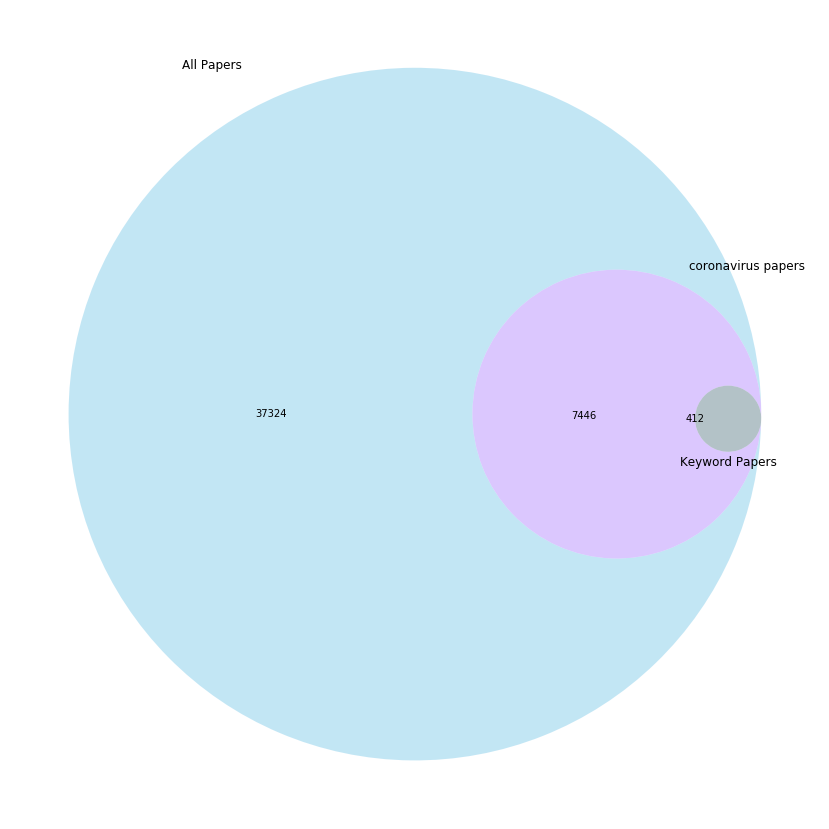

In [66]:
keywords = ['temperature','heat','cold','tropical','temperate','tropic','sunlight','summer','winter','spring','autumn','latitude']
all_coronavirus_papers,coronavirus_papers_with_keywords,coronavirus_papers_with_keywords_titles,sentences_with_keywords,sentences_with_keywords_paper_title = findLiteratureByStrain(metadata,'coronavirus',keywords)

# How many papers in the literature found it to be a risk factor?

This part is a true work in progress as the high risk and kol risk keywords need to be vetted by experts in the medical field (I have made these lists based on my work in academia looking at causal relations but I work mostly in econ and development so the terms in the medical field could be very different). Also, all the papers are not classified yet cause the lists are not exhaustive enough.

In [67]:
def isRiskOrNot(strain_paper_list,strain_title_list):
    hr_list =[]
    lr_list = []  
    
    high_risk_terms = ['increased','higher','more','positive','raise','risk factor','risk',
                      'significantly','progression','majority','most','positively','support','supported',
                      'threatening','threaten','life-threatening','obvious','poor','inhibits',
                       'cause','caused','significant','significantly','associated','associations','correlation',
                    'correlated','found','find','included','include','support','supported']# 'associated','associations',,'included'
    
    low_risk_terms = ['decreased','lower','less','negative','reduce','improvement','not','rare','few','negatively',
                      'successful'] 
    
    risk_category = []
    for paper,title in zip(strain_paper_list,strain_title_list):
        paper_risk_category = []
        for sentence in sent_tokenize(paper):
            hr_keywords_found = False
            lr_keywords_found = False 
             
            for word in word_tokenize(sentence):
                if word in high_risk_terms:
                    
                    hr_keywords_found = True
                if word in low_risk_terms:
                    
                    lr_keywords_found = True

            if hr_keywords_found==True: 
                paper_risk_category.append('high')
                hr_list.append(sentence) 
            if lr_keywords_found==True:
                paper_risk_category.append('low')
                lr_list.append(sentence)    
        
        paper_risk_category = ','.join(paper_risk_category)
        risk_category.append(paper_risk_category)
    return hr_list,lr_list,risk_category

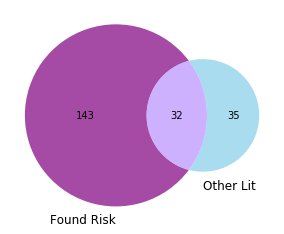

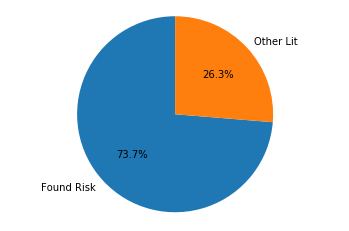

In [68]:
high_risk,low_risk,risk_category_list= isRiskOrNot(sentences_with_keywords,sentences_with_keywords_paper_title)

risk_dict ={}
for risk_cat in ['high','low']:
    risk_cat_papers = [title for title,risk in zip(sentences_with_keywords_paper_title,risk_category_list) if risk_cat in risk.split(',')]
    risk_dict[risk_cat] = set(risk_cat_papers)

import matplotlib_venn
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted
from matplotlib_venn import venn3, venn3_circles
subset = matplotlib_venn._venn2.compute_venn2_subsets(risk_dict['high'],risk_dict['low'])
venn2(subsets = (subset), set_labels = ('Found Risk','Other Lit'),set_colors=('purple', 'skyblue'), alpha = 0.7)

import matplotlib.pyplot as plt
sizes = np.array([len(high_risk),len(low_risk)])#,len(causal_list)])
labels ='Found Risk','Other Lit'#,'causal_list'

fig1, ax1 = plt.subplots()
ax1.pie(sizes,labels=labels, autopct='%1.1f%%',startangle=90) #shadow=True, 
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

So, what we can see is that majority of the literature did find termperature to be a high risk factor, though there is some overlap with the low risk literature. The lesser the overlap between the two categories, the better is our categorization.

#### So, which papers for high risk factors in this literature?

In [104]:
# Divergent plot
paper_title = []
title_lengths =[]
colors = []
for entry in set(zip(sentences_with_keywords_paper_title,risk_category_list)):
    title = entry[0]
    risk = entry[1]
    
    if ('high' in risk.split(',')) & ('low' not in risk.split(',')) :
        title_lengths.append(len(title))
        colors.append('red')
        paper_title.append(title)
        
    elif ('low' in risk.split(',')) & ('high' not in risk.split(',')):
        title_lengths.append(-len(title))
        colors.append('green')
        paper_title.append(title)
        
    elif ('low' in risk.split(',')) & ('high' in risk.split(',')):
        title_lengths.append(len(title))
        colors.append('blue')
        paper_title.append(title) 
        
print(len(title_lengths),len(paper_title))

228 228


In [105]:
sorted_list = sorted(zip(paper_title,title_lengths,colors),key=lambda x: x[1])
sorted_colors = [element[2] for element in sorted_list]
sorted_title_len = [element[1] for element in sorted_list]

[('pathogenic murine coronaviruses i. characterization of biological behavior in vitro and virus-specific intracellular rna of strongly neurotropic jhmv and weakly neurotropic a59v viruses',
  -185,
  'green'),
 ('diagnostic value of real-time polymerase chain reaction to detect viruses in young children admitted to the paediatric intensive care unit with lower respiratory tract infection',
  -177,
  'green'),
 ('epidemiology and clinical presentations of the four human coronaviruses 229e, hku1, nl63, and oc43 detected over 3 years using a novel multiplex real-time pcr method',
  -165,
  'green'),
 ('epidemiological and ecological modelling reveal diversity in upper respiratory tract microbial population structures from a cross-sectional community swabbing study',
  -164,
  'green'),
 ('analysis of coronavirus temperature-sensitive mutants reveals an interplay between the macrodomain and papain-like protease impacting replication and pathogenesis',
  -162,
  'green'),
 ('detection of b

In [130]:
#need to work on this viz or remove it all together
plt.figure(figsize=(20,200))
plt.hlines(y=range(len(title_lengths)), xmin=0, xmax=sorted_title_len,color=sorted_colors,  alpha=0.2, linewidth=50)

for num,sentence in enumerate(sorted(zip(paper_title,title_lengths,colors),key=lambda x: x[1])):
    if (sentence[2] =='red')|(sentence[2] =='blue'):
        plt.text(0,num,sentence[0],color='black', weight='bold',wrap=True, fontsize=50)
    elif sentence[2] =='green':
        plt.text(sentence[1],num,sentence[0],color='black', weight='bold',wrap=True, fontsize=50)
    
    
# Decorations
plt.gca().set(ylabel='Paper')
plt.show()

# Saving and Exporting 

In [133]:
export = pd.DataFrame({'title':sentences_with_keywords_paper_title,'sentences':sentences_with_keywords});export

,title,sentences
0,epidemiological and ecological modelling revea...,deviations from a neutral model of ecological ...
1,beware of asymptomatic transmission: study on ...,"in the early stage , people knows little abou..."
2,distribution of the 2019-ncov epidemic and cor...,due to the upcoming spring festival return tra...
3,analysis of meteorological conditions and pred...,results: this study found that the suitable te...
4,analysis of meteorological conditions and pred...,cold air and continuous low temperature over o...
...,...,...
594,clinical presentation and outcomes of long-ter...,the most common symptoms among residents were ...
595,a cohort study of the effect of winter dysente...,a cohort study of the effect of winter dysente...
596,a cohort study of the effect of winter dysente...,a cohort study was performed based on reports ...
597,role of cd25(+) cd4(+) t cells in acute and pe...,role of cd25 ( + ) cd4 ( + ) t cells in acut...


In [140]:
grouped_data = export.groupby(['title'], as_index=False)['sentences'].sum();grouped_data

,title,sentences
0,2518. the role of non-influenza viruses in the...,conclusion: non-influenza respiratory viruses ...
1,36th international symposium on intensive care...,burke p036 - does zero heat flux thermometry m...
2,634. transcriptional stimulation of antiviral ...,transcriptional stimulation of antiviral respo...
3,[treatment of pancreatic diseases and preventi...,the body temperature of care givers was measur...
4,a case-crossover analysis of the impact of wea...,data from meteorological stations closest to t...
...,...,...
406,wet markets—a continuing source of severe acut...,summary context live-animal markets ( wet mar...
407,what we do when a covid-19 patient needs an op...,an additional heat and moisture exchanger ( h...
408,will novel virus go pandemic or be contained?,influenza typically only spreads during the wi...
409,"without its n-finger, the main protease of sev...",here we report that the sars m ( pro ) c-term...


In [144]:
merged_df = grouped_data.merge(metadata[['cord_uid','source_x','title','abstract','publish_time',
                    'authors','journal']],on='title')
merged_df

,title,sentences,cord_uid,source_x,abstract,publish_time,authors,journal
0,2518. the role of non-influenza viruses in the...,conclusion: non-influenza respiratory viruses ...,p57tsbyw,PMC,background: influenza virus (iv) is a leading ...,2018-11-26,"Dean, Chelsea; Fitzgibbons, Lynn; Li, Jeanne; ...",Open Forum Infect Dis
1,36th international symposium on intensive care...,burke p036 - does zero heat flux thermometry m...,1vimqhdp,PMC,p001 - sepsis impairs the capillary response w...,2016-04-20,"Bateman, R. M.; Sharpe, M. D.; Jagger, J. E.; ...",Crit Care
2,634. transcriptional stimulation of antiviral ...,transcriptional stimulation of antiviral respo...,kvas63zr,PMC,"background: in kuwait, human coronavirus oc43 ...",2018-11-26,"Al-Nakib, Widad Widad; Beidas, Meshal; Chehade...",Open Forum Infect Dis
3,[treatment of pancreatic diseases and preventi...,the body temperature of care givers was measur...,ezok5n6j,WHO,objective: to explorethe proper protective mea...,2020,"Gou, S. M.; Yin, T.; Xiong, J. X.; Peng, T.; L...",Zhonghua wai ke za zhi [Chinese journal of sur...
4,a case-crossover analysis of the impact of wea...,data from meteorological stations closest to t...,jc1k3fki,PMC,background: middle east respiratory syndrome c...,2019-02-04,"Gardner, Emma G.; Kelton, David; Poljak, Zvoni...",BMC Infect Dis
...,...,...,...,...,...,...,...,...
411,wet markets—a continuing source of severe acut...,summary context live-animal markets ( wet mar...,oufi7w1d,Elsevier,summary context live-animal markets (wet marke...,2004-01-17,"Webster, Robert G",The Lancet
412,what we do when a covid-19 patient needs an op...,an additional heat and moisture exchanger ( h...,7mldvo3j,WHO,we read with interest the recent review in the...,2020-03-06,"Ti, Lian Kah; Ang, Lin Stella; Foong, Theng Wa...",Canadian Journal of Anesthesia/Journal canadie...
413,will novel virus go pandemic or be contained?,influenza typically only spreads during the wi...,5y1qgjr8,WHO,the repatriation of 565 japanese citizens from...,2020-02-06,"Kupferschmidt, Kai; Cohen, Jon",Science
414,"without its n-finger, the main protease of sev...",here we report that the sars m ( pro ) c-term...,m68mbdqs,PMC,the main protease (m(pro)) of severe acute res...,2008-02-27,"Zhong, Nan; Zhang, Shengnan; Zou, Peng; Chen, ...",Journal of Virology


In [145]:
merged_df.to_excel('coronavirus_temperature_sentences.xlsx')